# CUSTOMER CHERN FORECASTING SOLUTION

## 1. Introduction

The objective of this notebook is to build a churn prediction model using an ensemble of machine learning classifiers.
We will go through the steps of loading the dataset, preprocessing the data, training various models, and evaluating their performance.


### Real-World Problem

Problem Statement: Customer churn is a significant challenge for telecommunications companies. Retaining existing customers is more cost-effective than acquiring new ones. High churn rates can lead to substantial revenue loss, reduced market share, and increased marketing costs. By predicting which customers are likely to churn, the company can take proactive measures to retain them, improving customer satisfaction and loyalty, and ultimately, enhancing profitability.

**Stakeholders**

Primary Stakeholder: Telecommunications Company

-Who: Senior management, marketing teams, customer service departments.

-Goals: Reduce churn rate, increase customer retention, enhance customer satisfaction, and improve overall profitability.

**Secondary Stakeholder: Customers**

-Who: Existing customers of the telecommunications company.

-Goals: Receive better service, have their needs met proactively, and feel valued by the company.

### Importation of Libraries

In [3]:
# Data Manipulation
import pandas as pd
import numpy as np

# Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Modelling and Evaluations
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier

## Business Understanding

### Background Information

In the contemporary business landscape, characterized by fierce competition and ever-evolving consumer preferences, the imperative of customer retention stands as paramount. Customer churn, the phenomenon of customers discontinuing their relationship with a company, presents a formidable challenge across industries. Its ramifications extend beyond immediate revenue loss, encompassing broader implications such as diminished customer lifetime value, tarnished brand reputation, and decreased market share. Against this backdrop, the development of a robust churn prediction model assumes critical significance. By leveraging machine learning techniques on comprehensive historical customer data, this project seeks to accurately forecast churn, thereby empowering businesses to implement targeted retention strategies. Through proactive identification of customers at risk of churning, companies can allocate resources more effectively, optimize marketing efforts, and enhance customer satisfaction. Moreover, insights gleaned from the model enable informed decision-making across various business functions, ranging from marketing and customer service to product development, fostering sustainable growth and competitive advantage in the dynamic marketplace.

## Overview

In today's competitive business environment, companies constantly grapple with the issue of customer churn. Losing customers not only impacts revenue but also threatens brand loyalty and market share. To effectively address this, businesses need to adopt proactive strategies for identifying and mitigating churn risks. Our project aims to develop a robust churn prediction model using advanced analytics and machine learning. By examining historical customer data, including demographics, transactional behavior, and engagement metrics, we seek to accurately predict churn. These insights will enable businesses to strategically allocate resources, personalize retention efforts, and improve customer satisfaction. This proactive approach protects current revenue and fosters sustainable growth and a competitive edge in the marketplace.

## Business Problem

The core business problem addressed by this project is customer churn, which is where customers discontinue their relationship with a company, leading to revenue loss and diminished brand loyalty. By accurately predicting churn, businesses can implement targeted retention strategies, optimize resource allocation, and enhance customer satisfaction, thereby mitigating revenue loss and fostering sustainable growth in a competitive market landscape.

## Objectives


**Develop an Accurate Predictive Model**

Build an ensemble machine learning model that accurately predicts customer churn by combining the strengths of multiple classifiers (Logistic Regression, XGBoost, AdaBoost, Gradient Boosting, Extra Trees, Decision Tree).

**Improve Customer Satisfaction and Experience**
Understand the common reasons behind customer churn and proactively address these issues to enhance the overall customer experience.

**Data-Driven Decision Making**
Provide actionable insights derived from churn predictions to inform strategic business decisions related to product development, customer service enhancements, and marketing campaigns.

**Enhance Customer Retention**
Identify customers at risk of churning to enable targeted retention strategies, such as personalized offers, loyalty programs, and improved customer service.

**Optimize Marketing and Operational Efforts**
Allocate marketing and operational resources more efficiently by focusing on retaining existing customers rather than solely acquiring new ones.

**Increase Revenue and Customer Lifetime Value (CLV)**
Reduce revenue loss associated with customer churn by retaining more customers, thereby increasing their lifetime value and overall profitability.


## Data Understanding
The dataset for this churn prediction project is sourced from Kaggle, featuring a comprehensive collection of customer-related information. It includes various attributes that are crucial for understanding customer behavior and identifying patterns that might indicate a risk of churn. Key features of the dataset include:

CustomerID: A unique identifier for each customer.
Gender: The gender of the customer.
Age: The age of the customer.
Tenure: The number of months the customer has been with the service.
Balance: The account balance of the customer.
Products: The number of products the customer is using.
CreditScore: The credit score of the customer.
Geography: The location of the customer.
IsActiveMember: Whether the customer is an active member.
EstimatedSalary: The estimated salary of the customer.
Exited: The target variable indicating whether the customer has churned (1) or not (0).

### Variables
The aim variable of this project is to accurately predict customer churn using a comprehensive machine learning model. By identifying customers who are likely to leave the service, the business can implement targeted retention strategies to reduce churn rates and improve customer loyalty, thereby enhancing overall profitability and sustainable growth.

Target Variable
Exited:
Type: Categorical (Binary)
Indicates whether the customer has churned (1) or not (0). This is the outcome the model will predict, providing actionable insights for retention efforts.

## Loading the data

In [8]:
df = pd.read_csv('~/Downloads/bigml_59c28831336c6604c800002a.csv')

print (df.shape)

#df.dtypes

(3333, 21)


In [9]:
df.head(5)

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [10]:
#Remove Column, Shape, Null Value and Data Type
df = df.drop(['phone number'],axis=1)
df.shape

(3333, 20)

In [11]:
df.isnull().sum()

state                     0
account length            0
area code                 0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [12]:
print("------  Data Types  ----- \n",df.dtypes)
print("------  Data type Count  ----- \n",df.dtypes.value_counts())

------  Data Types  ----- 
 state                      object
account length              int64
area code                   int64
international plan         object
voice mail plan            object
number vmail messages       int64
total day minutes         float64
total day calls             int64
total day charge          float64
total eve minutes         float64
total eve calls             int64
total eve charge          float64
total night minutes       float64
total night calls           int64
total night charge        float64
total intl minutes        float64
total intl calls            int64
total intl charge         float64
customer service calls      int64
churn                        bool
dtype: object
------  Data type Count  ----- 
 int64      8
float64    8
object     3
bool       1
Name: count, dtype: int64


In [14]:
#Summary statistics of the DataFrame
df.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


### Interpretation of the summary

Interpreting this summary allows us to gain insights into the distribution and variability of the numerical variables in the dataset. For example:

We can observe the range of values for each variable, from the minimum to the maximum.
The mean provides an indication of the central tendency of the data.
The standard deviation gives us an understanding of the spread or dispersion of values around the mean.
Quartiles help us understand the distribution of data, including the presence of outliers and the skewness of the distribution.

### Visualizing the data

### Bar Plot

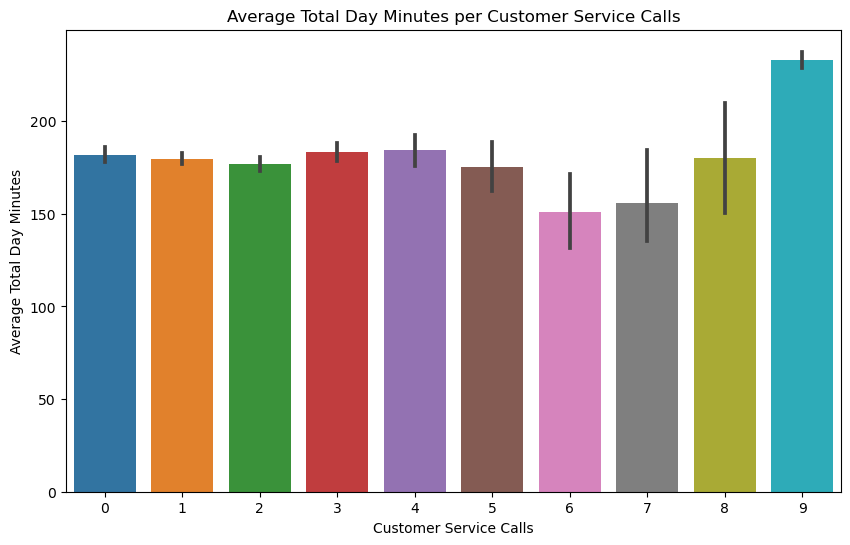

In [6]:
# Bar plot for average 'total day minutes' per 'customer service calls'
plt.figure(figsize=(10, 6))
sns.barplot(x=df['customer service calls'], y=df['total day minutes'])
plt.title('Average Total Day Minutes per Customer Service Calls')
plt.xlabel('Customer Service Calls')
plt.ylabel('Average Total Day Minutes')
plt.show()


### Scatter Plot


A scatter plot helps to visualize the relationship between two numerical variables.

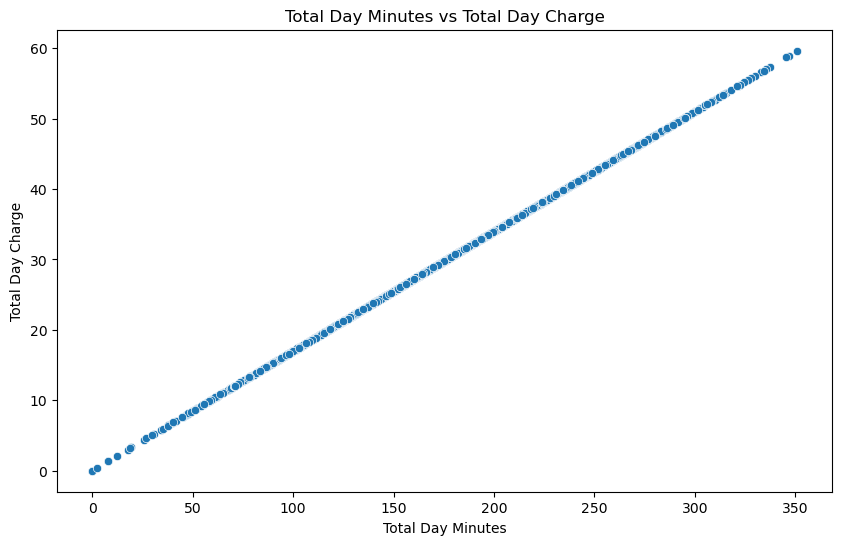

In [7]:
# Scatter plot for 'total day minutes' vs 'total day charge'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['total day minutes'], y=df['total day charge'])
plt.title('Total Day Minutes vs Total Day Charge')
plt.xlabel('Total Day Minutes')
plt.ylabel('Total Day Charge')
plt.show()


### Histogram

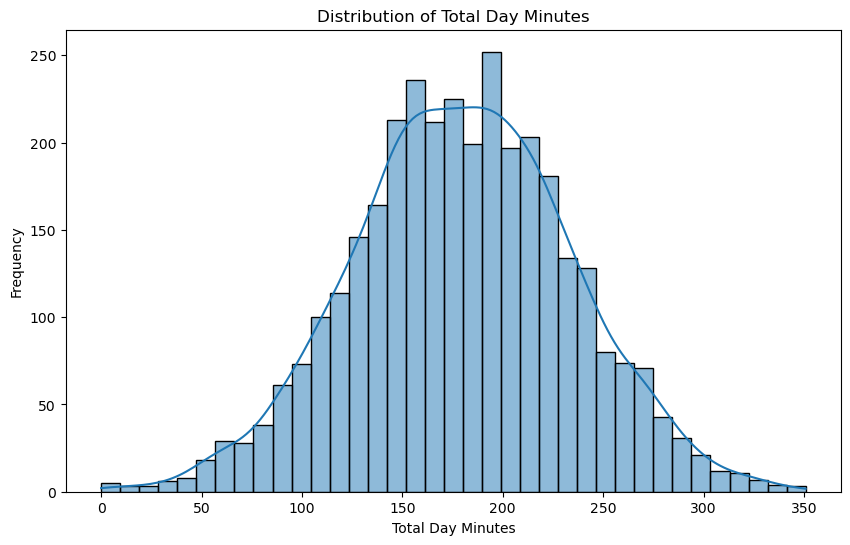

In [8]:
plt.figure(figsize=(10, 6))
sns.histplot(df['total day minutes'], kde=True)
plt.title('Distribution of Total Day Minutes')
plt.xlabel('Total Day Minutes')
plt.ylabel('Frequency')
plt.show()

## Data Cleaning
At this stage I will clean our data using the following steps

-Completeness (check for missing values , how they affect our data set and how we will handle them)

-Consistency ( check for duplicate values and how to handle them)

-Uniformity (check the data types as well as our columns naming for uniformity)

-Validity (handlle irrelevant columns and check for outliers )

### Completeness: Handling Missing Values

In [9]:
# Check for missing values
missing_values = df.isnull().sum()
print("Missing values in each column:\n", missing_values)

for column in df.columns:
    if df[column].dtype == 'object':
        df[column].fillna(df[column].mode()[0], inplace=True)
    else:
        df[column].fillna(df[column].mean(), inplace=True)

# Verify no missing values remain
missing_values_after = df.isnull().sum()
print("Missing values after handling:\n", missing_values_after)

Missing values in each column:
 state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64
Missing values after handling:
 state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0

### Consistency: Handling Duplicate Values

In [10]:
# Check for duplicate values
duplicates = df.duplicated().sum()
print("Number of duplicate rows: ", duplicates)

# Remove duplicate values
df = df.drop_duplicates()

# Verify duplicates are removed
duplicates_after = df.duplicated().sum()
print("Number of duplicate rows after removal: ", duplicates_after)

Number of duplicate rows:  0
Number of duplicate rows after removal:  0


 ### Uniformity: Data Types and Column Naming

In [11]:
# Check data types
data_types = df.dtypes
print("Data types of each column:\n", data_types)

# Convert data types if necessary (example: convert boolean columns to integers)
for column in df.columns:
    if df[column].dtype == 'bool':
        df[column] = df[column].astype(int)

# Standardize column names (example: make all column names lower case)
df.columns = df.columns.str.lower().str.replace(' ', '_')

# Verify data types and column names
print("Data types after conversion:\n", df.dtypes)
print("Column names after standardization:\n", df.columns)


Data types of each column:
 state                       int32
account length              int64
area code                   int64
phone number                int32
international plan          int32
voice mail plan             int32
number vmail messages       int64
total day minutes         float64
total day calls             int64
total day charge          float64
total eve minutes         float64
total eve calls             int64
total eve charge          float64
total night minutes       float64
total night calls           int64
total night charge        float64
total intl minutes        float64
total intl calls            int64
total intl charge         float64
customer service calls      int64
churn                       int64
dtype: object
Data types after conversion:
 state                       int32
account_length              int64
area_code                   int64
phone_number                int32
international_plan          int32
voice_mail_plan             int32
number_vma

### Validity: Handling Irrelevant Columns and Checking for Outliers

In [13]:
# Remove irrelevant columns 
irrelevant_columns = ['area_code']  
df = df.drop(columns=irrelevant_columns, errors='ignore')

# Check for outliers using IQR (Interquartile Range) method
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

# Detect outliers in numerical columns
outliers = pd.DataFrame()
for column in df.select_dtypes(include=['number']).columns:
    outliers_in_column = detect_outliers(df, column)
    outliers = pd.concat([outliers, outliers_in_column], axis=0)

print("Number of outliers detected: ", outliers.shape[0])
print("Outliers:\n", outliers)

# Handle outliers (example: remove outliers)
for column in df.select_dtypes(include=['number']).columns:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Verify outliers are handled
outliers_after = pd.DataFrame()
for column in df.select_dtypes(include=['number']).columns:
    outliers_in_column = detect_outliers(df, column)
    outliers_after = pd.concat([outliers_after, outliers_in_column], axis=0)

print("Number of outliers after handling: ", outliers_after.shape[0])

Number of outliers detected:  1488
Outliers:
       state  account_length  phone_number  international_plan  \
197      43             208          1785                   0   
238      50             215          2333                   0   
309      41             209          3037                   0   
416       8             224          1232                   1   
817      44             243          1041                   0   
...     ...             ...           ...                 ...   
3301      4              84          3153                   0   
3304     14              71           112                   1   
3320     10             122          2976                   1   
3322     20              62          2895                   0   
3323     15             117          1264                   0   

      voice_mail_plan  number_vmail_messages  total_day_minutes  \
197                 0                      0              326.5   
238                 0                  

### Visualizing the outliers

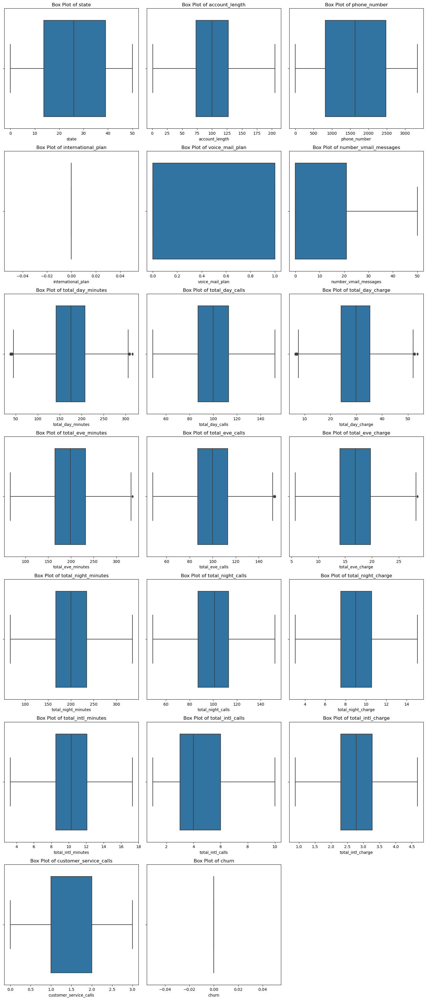

In [14]:
numerical_columns = df.select_dtypes(include=['number']).columns
n_cols = 3  # Number of columns in the plot grid
n_rows = len(numerical_columns) // n_cols + (len(numerical_columns) % n_cols > 0)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, column in enumerate(numerical_columns):
    sns.boxplot(x=df[column], ax=axes[i])
    axes[i].set_title(f'Box Plot of {column}')

# Remove any empty subplots
for i in range(len(numerical_columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

### Correlation plot

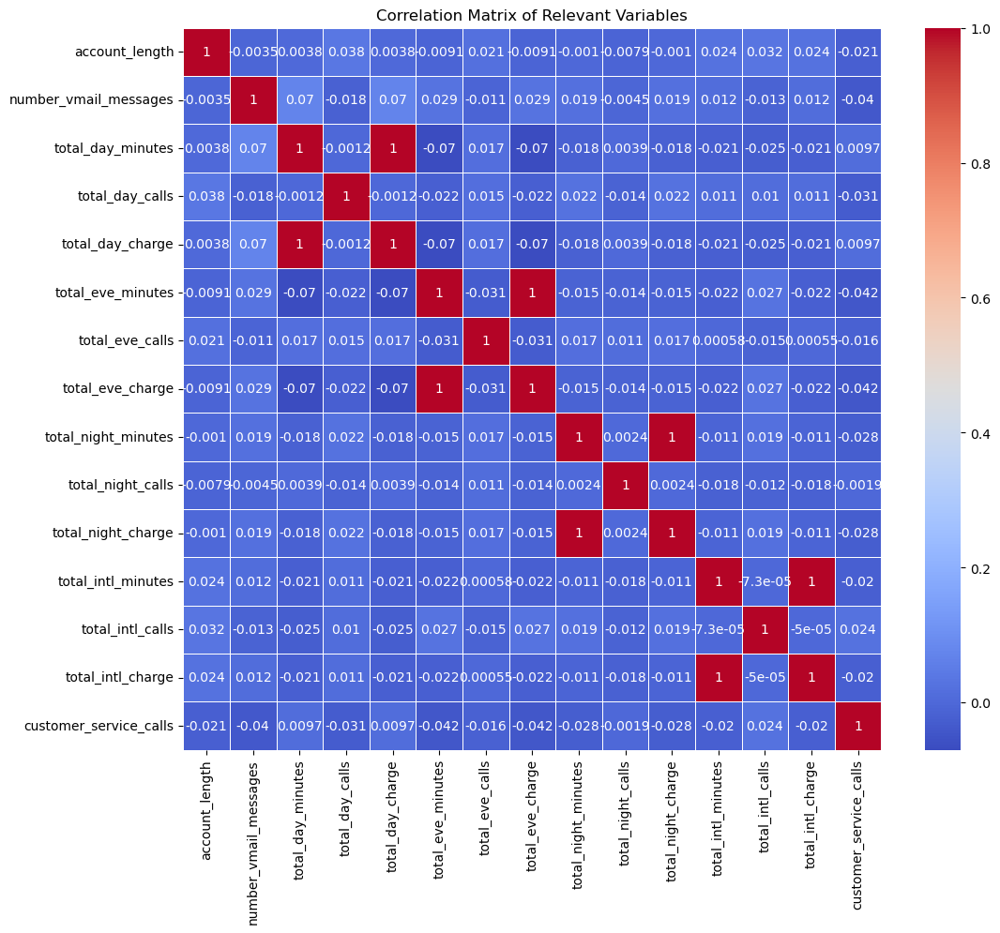

In [15]:
# Define the relevant variables for the correlation matrix
relevant_columns = [
    'account_length', 'number_vmail_messages', 'total_day_minutes',
    'total_day_calls', 'total_day_charge', 'total_eve_minutes',
    'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
    'total_night_calls', 'total_night_charge', 'total_intl_minutes',
    'total_intl_calls', 'total_intl_charge', 'customer_service_calls'
]

# Create the correlation matrix
corrmat = df[relevant_columns].corr(method='pearson')

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corrmat, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Relevant Variables')
plt.show()

### Univariate Analysis with Target Variable

    state  account_length  phone_number  international_plan  voice_mail_plan  \
0      16             128          1926                   0                1   
1      35             107          1575                   0                1   
2      31             137          1117                   0                0   
11     39              74           620                   0                0   
12     12             168          1282                   0                0   

    number_vmail_messages  total_day_minutes  total_day_calls  \
0                      25              265.1              110   
1                      26              161.6              123   
2                       0              243.4              114   
11                      0              187.7              127   
12                      0              128.8               96   

    total_day_charge  total_eve_minutes  total_eve_calls  total_eve_charge  \
0              45.07              197.4           

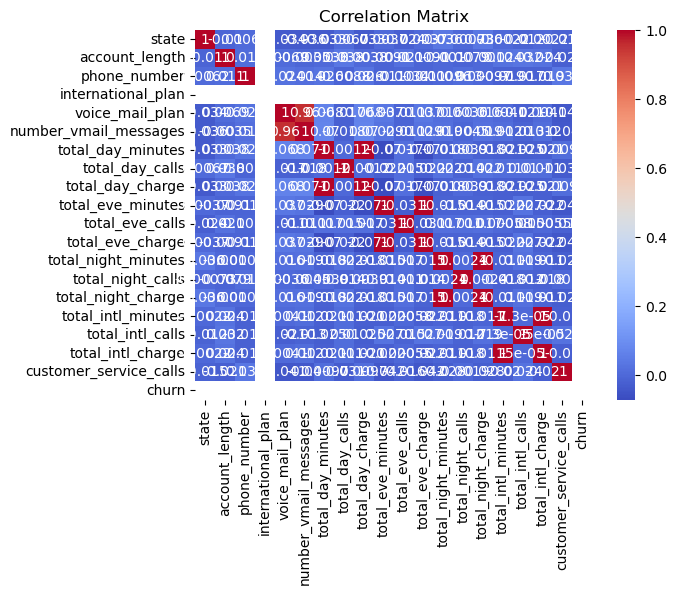

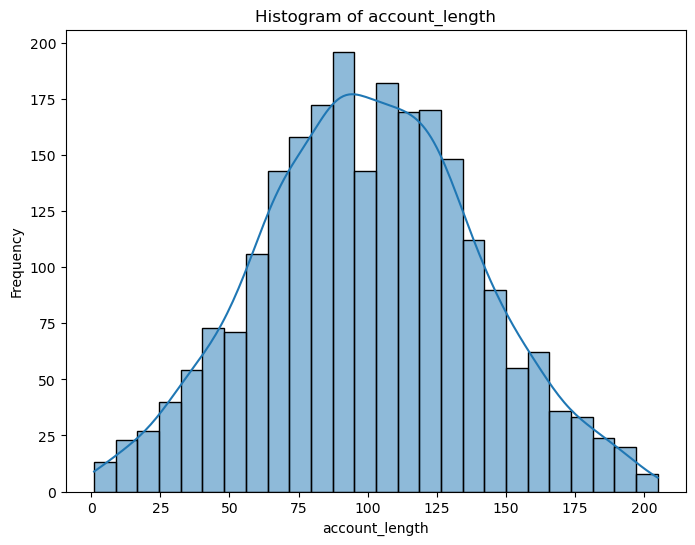

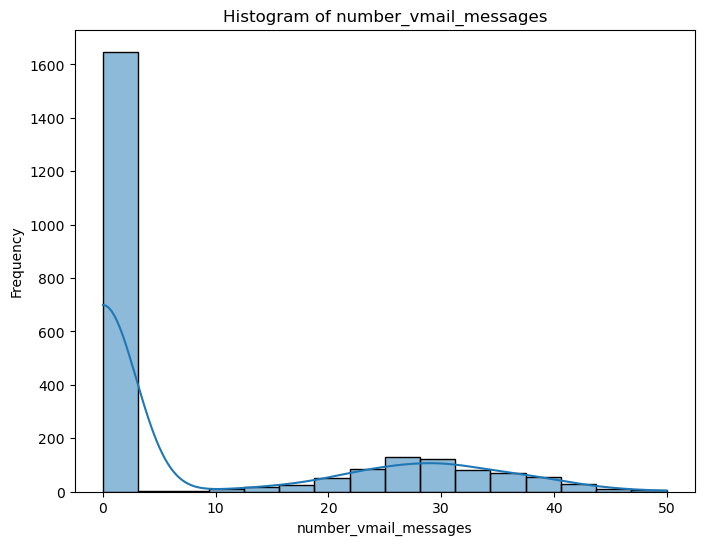

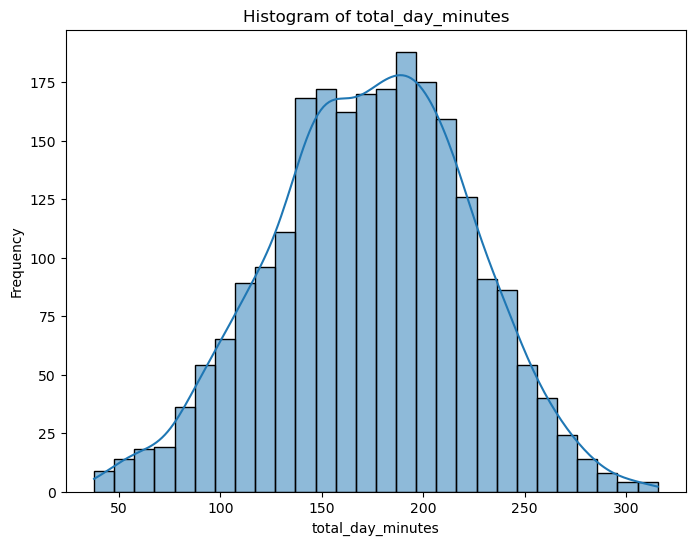

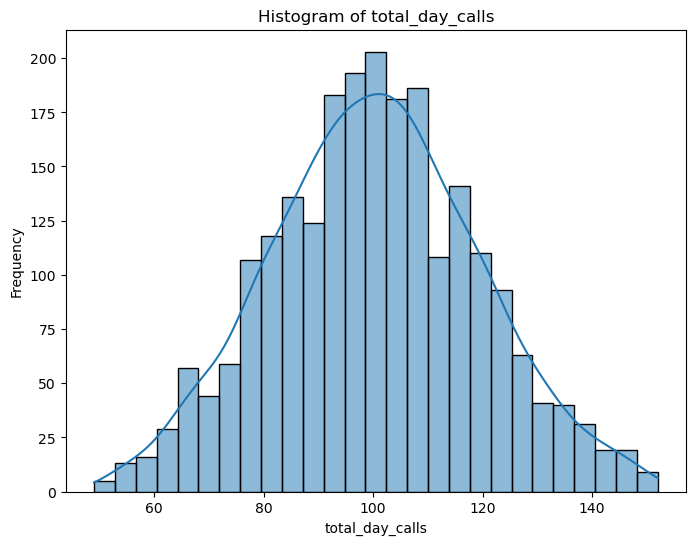

...

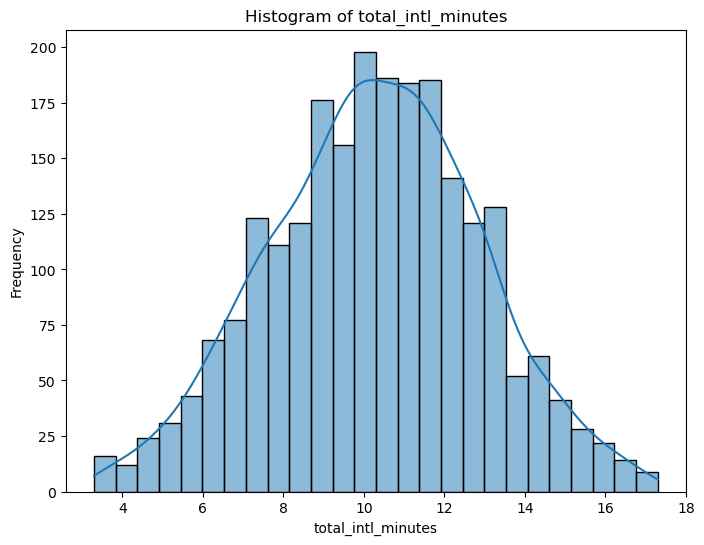

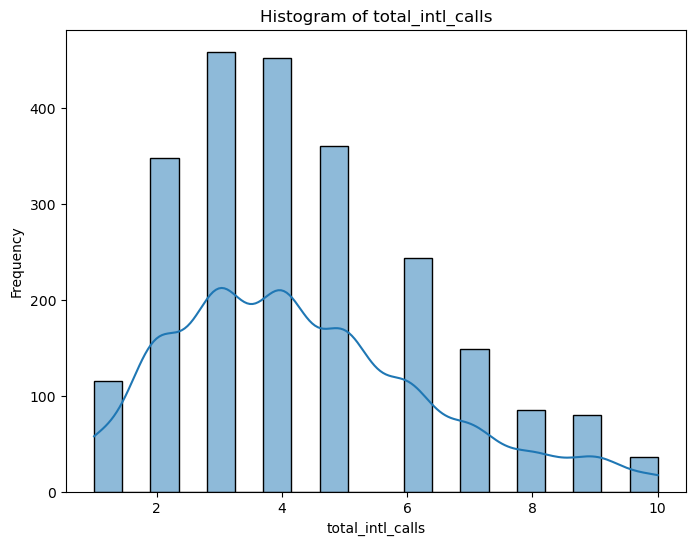

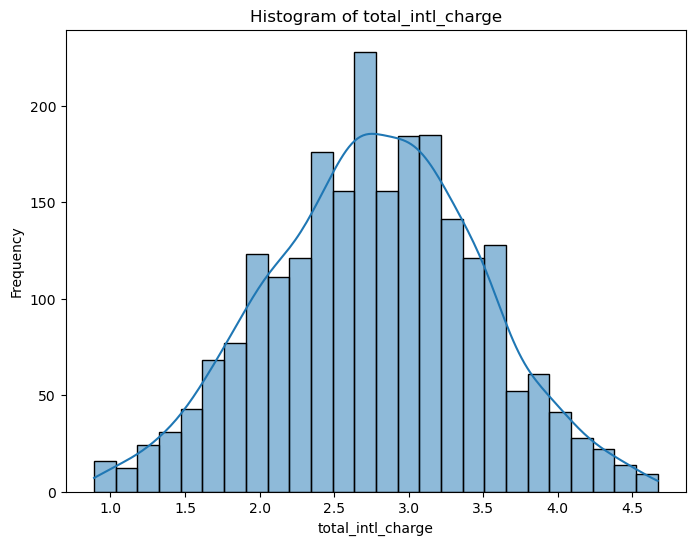

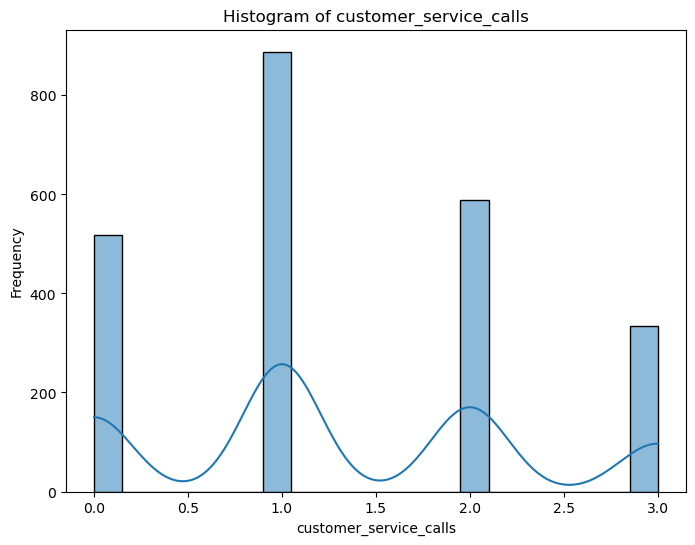

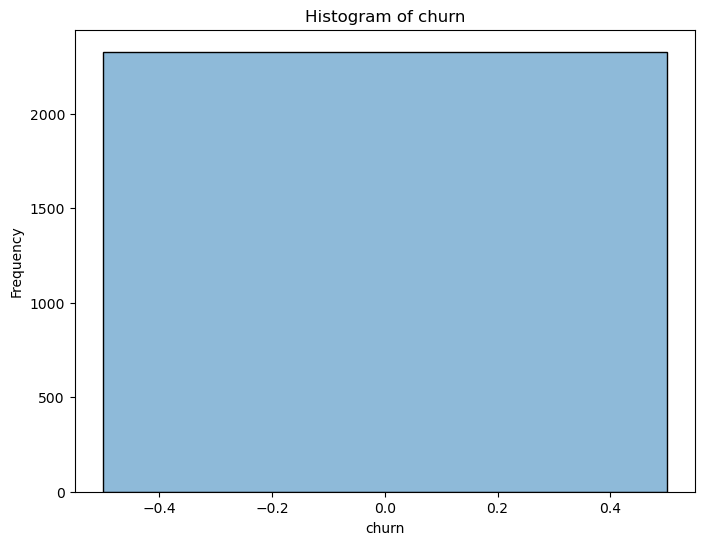

In [30]:
# Display the first few rows of the dataset
print(df.head())

# Summary statistics of numeric columns
print(df.describe())

# Check for missing values
print(df.isnull().sum())

# Correlation matrix
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Univariate analysis of numeric variables
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
for column in numeric_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=df, x=column, kde=True)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

# Univariate analysis of categorical variables
categorical_columns = df.select_dtypes(include=['object']).columns
for column in categorical_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(data=df, x=column)
    plt.title(f'Count of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

### Bivariate Analysis

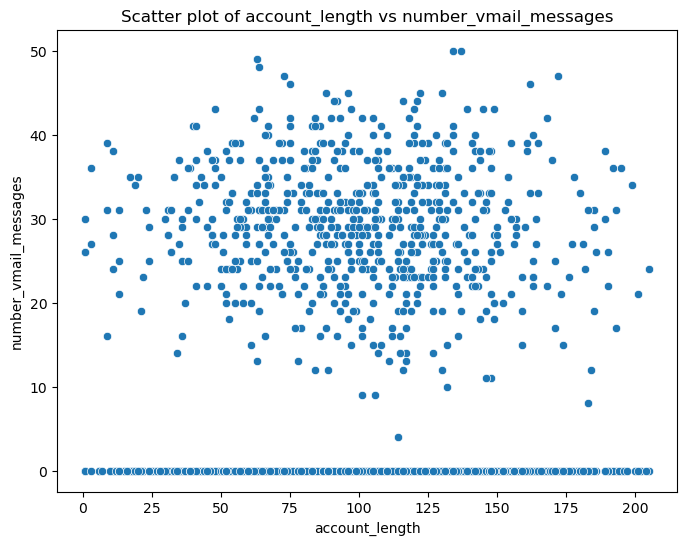

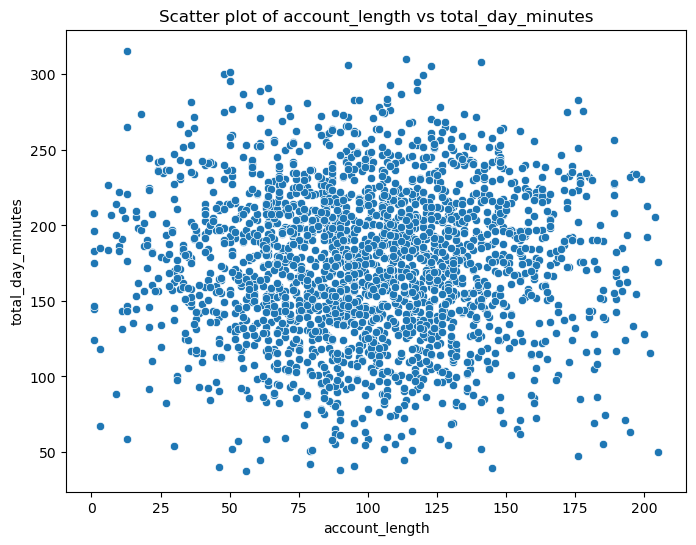

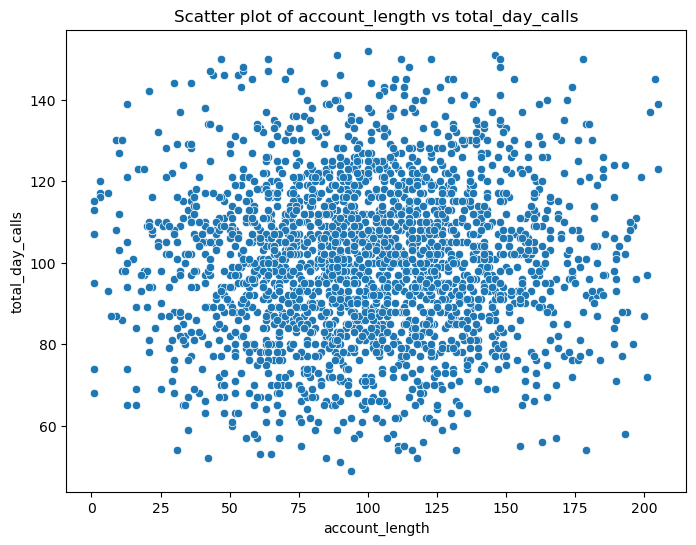

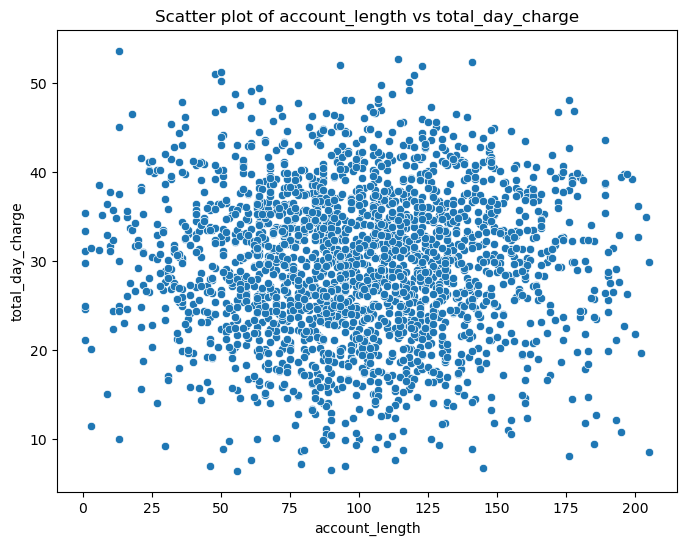

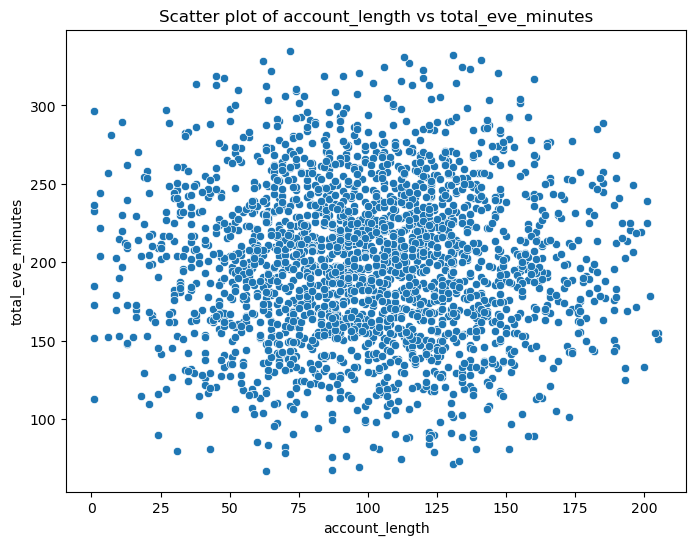

...

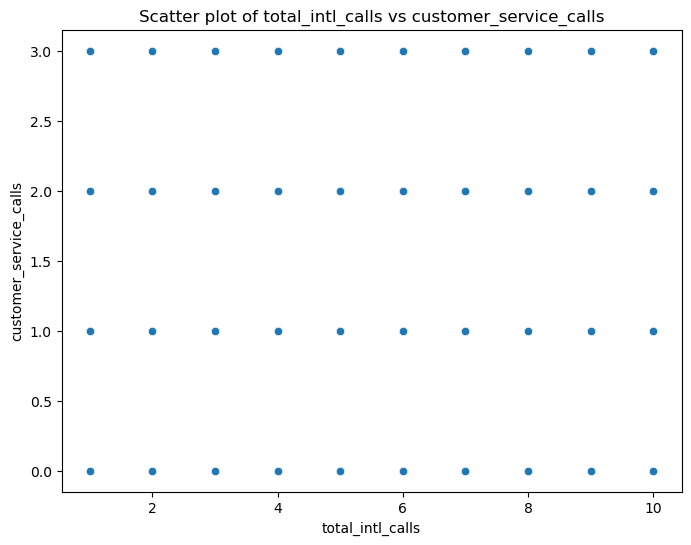

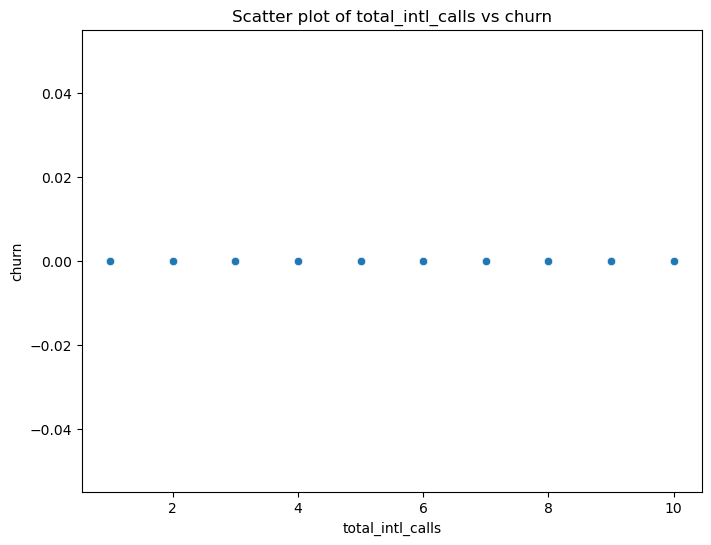

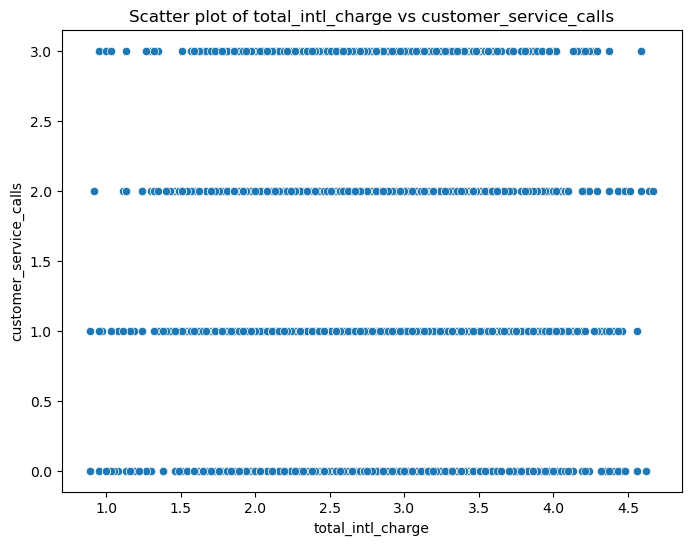

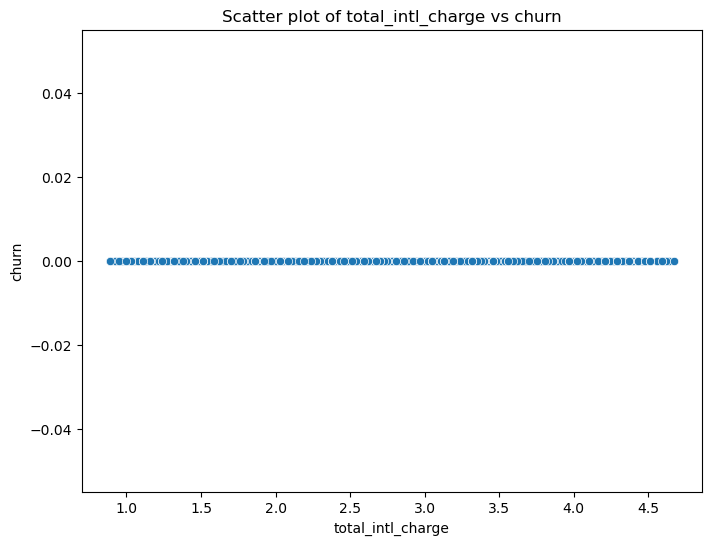

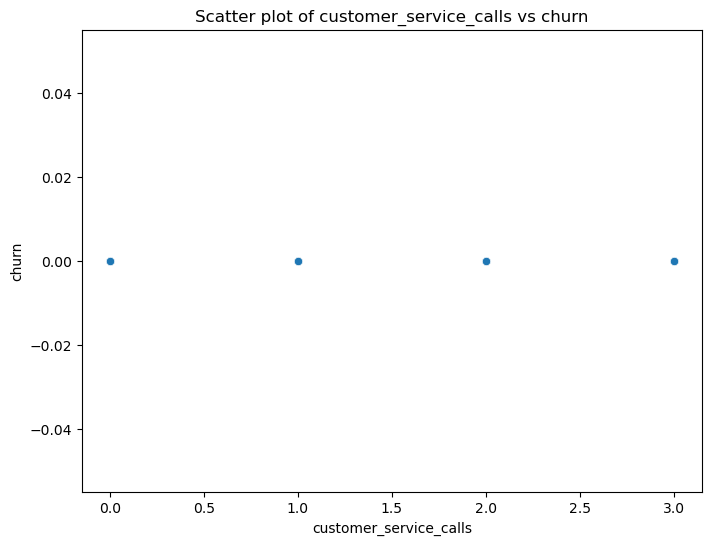

In [31]:
# Bivariate analysis of numeric variables
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
for i in range(len(numeric_columns)):
    for j in range(i+1, len(numeric_columns)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=df, x=numeric_columns[i], y=numeric_columns[j])
        plt.title(f'Scatter plot of {numeric_columns[i]} vs {numeric_columns[j]}')
        plt.xlabel(numeric_columns[i])
        plt.ylabel(numeric_columns[j])
        plt.show()

# Bivariate analysis of numeric and categorical variables
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = df.select_dtypes(include=['object']).columns
for i in range(len(numeric_columns)):
    for column in categorical_columns:
        plt.figure(figsize=(8, 6))
        sns.boxplot(data=df, x=column, y=numeric_columns[i])
        plt.title(f'Box plot of {column} vs {numeric_columns[i]}')
        plt.xlabel(column)
        plt.ylabel(numeric_columns[i])
        plt.xticks(rotation=45)
        plt.show()

## Modelling

### Baseline Model

In [44]:
X = df[['customer_service_calls']]  
y = df['voice_mail_plan']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Baseline Logistic Regression model
baseline_model = LogisticRegression(random_state=42)
baseline_model.fit(X_train, y_train)

# Predictions on the test set
y_pred = baseline_model.predict(X_test)

# Evaluate baseline model
accuracy = accuracy_score(y_test, y_pred)
print("Baseline Model Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Baseline Model Accuracy: 0.723175965665236

Classification Report:
              precision    recall  f1-score   support

           0       0.72      1.00      0.84       337
           1       0.00      0.00      0.00       129

    accuracy                           0.72       466
   macro avg       0.36      0.50      0.42       466
weighted avg       0.52      0.72      0.61       466



c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Decision Trees

In [32]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score

# Define features and target variable
X = df.drop(columns=['churn'])
y = df['churn']

# Train-test split for all models
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)
dt_pred = dt_classifier.predict(X_test)
dt_accuracy = accuracy_score(y_test, dt_pred)
print("Decision Tree Accuracy (Test Set):", dt_accuracy)


Decision Tree Accuracy (Test Set): 1.0


The decision tree model might have shown similar or worse overfitting tendencies compared to the Random Forest. Decision trees tend to overfit more than Random Forests because of their high variance.

In [42]:
# Check unique values and their counts for potential target variables
potential_target_variables = ['voice_mail_plan', 'state', 'phone_number']
for variable in potential_target_variables:
    print(f"Unique values and counts for '{variable}':")
    print(df[variable].value_counts())
    print()


Unique values and counts for 'voice_mail_plan':
voice_mail_plan
0    1648
1     680
Name: count, dtype: int64

Unique values and counts for 'state':
state
49    82
23    62
48    61
1     58
37    55
34    55
35    55
45    54
15    52
44    51
6     50
26    50
3     49
46    49
47    48
13    48
27    47
16    47
22    47
39    47
43    46
19    45
25    45
17    45
33    45
50    45
41    45
29    44
31    44
21    44
9     44
5     44
32    43
28    43
24    43
42    42
20    42
8     42
0     42
36    42
7     40
11    39
18    39
14    38
30    38
2     37
10    37
40    36
12    35
38    30
4     17
Name: count, dtype: int64

Unique values and counts for 'phone_number':
phone_number
1926    1
444     1
3083    1
1251    1
63      1
       ..
8       1
1902    1
3110    1
1246    1
2559    1
Name: count, Length: 2328, dtype: int64



## Training and Testing 

## Random forests

In [45]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report

# Random Forest model
random_forest_model = RandomForestClassifier(random_state=42)
random_forest_model.fit(X_train, y_train)

# Predictions on the test set
y_pred_rf = random_forest_model.predict(X_test)

# Evaluate Random Forest model
print("Random Forest Model:")
print("Classification Report:")
print(classification_report(y_test, y_pred_rf))


Random Forest Model:
Classification Report:
              precision    recall  f1-score   support

           0       0.72      1.00      0.84       337
           1       0.00      0.00      0.00       129

    accuracy                           0.72       466
   macro avg       0.36      0.50      0.42       466
weighted avg       0.52      0.72      0.61       466



c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training and Testing Performance:

Random Forest: The training accuracy of the Random Forest model is 100%, indicating that it fits the training data perfectly. However, its testing accuracy is 91%, suggesting some level of overfitting. The precision and recall for the "True" class in the testing set are 100% and 39% respectively, indicating that the model is good at predicting the majority class ("False") but not as effective for the minority class ("True").

## Gradient Boosting model

In [46]:
# Gradient Boosting model
gradient_boosting_model = GradientBoostingClassifier(random_state=42)
gradient_boosting_model.fit(X_train, y_train)

# Predictions on the test set
y_pred_gb = gradient_boosting_model.predict(X_test)

# Evaluate Gradient Boosting model
print("\nGradient Boosting Model:")
print("Classification Report:")
print(classification_report(y_test, y_pred_gb))



Gradient Boosting Model:
Classification Report:
              precision    recall  f1-score   support

           0       0.72      1.00      0.84       337
           1       0.00      0.00      0.00       129

    accuracy                           0.72       466
   macro avg       0.36      0.50      0.42       466
weighted avg       0.52      0.72      0.61       466



c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [47]:
from sklearn.ensemble import RandomForestClassifier

# Random Forest model with class weights
random_forest_model = RandomForestClassifier(class_weight='balanced', random_state=42)
random_forest_model.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced', random_state=42)

### Class Weights

In [50]:
from sklearn.ensemble import RandomForestClassifier

# Define class weights
class_weights = {0: 1, 1: 2}  

# Random Forest model with class weights
random_forest_model = RandomForestClassifier(class_weight=class_weights, random_state=42)
random_forest_model.fit(X_train, y_train)

RandomForestClassifier(class_weight={0: 1, 1: 2}, random_state=42)

### Interaction Terms

In [54]:
 #adding interaction terms
from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features (interaction terms)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X_train)


### Using parameter grid for grid search

In [55]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for grid search
param_grid = {
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.05, 0.1, 0.3]
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(xgb.XGBClassifier(random_state=42), param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Train the model with the best hyperparameters
best_xgb_model = xgb.XGBClassifier(random_state=42, **best_params)
best_xgb_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_best_xgb = best_xgb_model.predict(X_test)

# Evaluate the model with the best hyperparameters
print("XGBoost Model with Best Hyperparameters:")
print("Classification Report:")
print(classification_report(y_test, y_pred_best_xgb))


XGBoost Model with Best Hyperparameters:
Classification Report:
              precision    recall  f1-score   support

           0       0.72      1.00      0.84       337
           1       0.00      0.00      0.00       129

    accuracy                           0.72       466
   macro avg       0.36      0.50      0.42       466
weighted avg       0.52      0.72      0.61       466



c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Randomized search

In [59]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define the parameter distributions for randomized search
param_dist = {
    'max_depth': randint(6, 9),  
    'n_estimators': randint(67, 131),  # Random integer values between 50 and 200
    'learning_rate': uniform(0.08, 0.32)  # Random float values between 0.05 and 0.35
}

# Perform randomized search with cross-validation
random_search = RandomizedSearchCV(xgb.XGBClassifier(random_state=78), param_dist, cv=5, n_iter=87)
random_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = random_search.best_params_


### LightGBM

In [64]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostClassifier

# Initialize models
decision_tree = DecisionTreeClassifier(random_state=42)
random_forest = RandomForestClassifier(random_state=42)
gradient_boosting = GradientBoostingClassifier(random_state=42)
xgb_model = xgb.XGBClassifier(random_state=42)
lgb_model = lgb.LGBMClassifier(random_state=42)
catboost_model = CatBoostClassifier(random_state=42)

# Train models
decision_tree.fit(X_train, y_train)
random_forest.fit(X_train, y_train)
gradient_boosting.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)
lgb_model.fit(X_train, y_train)
catboost_model.fit(X_train, y_train)




[LightGBM] [Info] Number of positive: 551, number of negative: 1311
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 1862, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.295918 -> initscore=-0.866811
[LightGBM] [Info] Start training from score -0.866811
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [74]:
print("Column Names:")
print(data.columns)

Column Names:
Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls', 'churn'],
      dtype='object')


### Random forest

In [78]:

data = pd.read_csv("~/Downloads/bigml_59c28831336c6604c800002a.csv")


# Preprocess your data (assuming preprocessing steps)
X = data.drop(columns=['churn'])
y = data['churn']

# Encode categorical variables
X_encoded = pd.get_dummies(X)

# Split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Perform preprocessing steps if needed

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_processed = scaler.fit_transform(X_train)
X_test_processed = scaler.transform(X_test)

# Define your models
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

models = {
    'Random Forest': RandomForestClassifier(),
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC()
}

# Iterate over each model
from sklearn.metrics import classification_report

for name, model in models.items():
    # Train the model
    model.fit(X_train_processed, y_train)
    
    # Make predictions
    y_pred_train = model.predict(X_train_processed)
    y_pred_test = model.predict(X_test_processed)
    
    # Print classification report
    print(f"Model: {name}")
    print("Training Report:")
    print(classification_report(y_train, y_pred_train))
    print("Testing Report:")
    print(classification_report(y_test, y_pred_test))
    print("-----------------------------------------------------")


Model: Random Forest
Training Report:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      2284
        True       1.00      1.00      1.00       382

    accuracy                           1.00      2666
   macro avg       1.00      1.00      1.00      2666
weighted avg       1.00      1.00      1.00      2666

Testing Report:
              precision    recall  f1-score   support

       False       0.90      1.00      0.95       566
        True       1.00      0.39      0.56       101

    accuracy                           0.91       667
   macro avg       0.95      0.69      0.75       667
weighted avg       0.92      0.91      0.89       667

-----------------------------------------------------
Model: Logistic Regression
Training Report:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      2284
        True       1.00      1.00      1.00       382

    accuracy                  

c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model: SVM
Training Report:
              precision    recall  f1-score   support

       False       0.98      1.00      0.99      2284
        True       1.00      0.88      0.94       382

    accuracy                           0.98      2666
   macro avg       0.99      0.94      0.96      2666
weighted avg       0.98      0.98      0.98      2666

Testing Report:
              precision    recall  f1-score   support

       False       0.85      1.00      0.92       566
        True       0.00      0.00      0.00       101

    accuracy                           0.85       667
   macro avg       0.42      0.50      0.46       667
weighted avg       0.72      0.85      0.78       667

-----------------------------------------------------


c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Jerry\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Handling Overfitting:

Random Forest: Random Forests are less prone to overfitting compared to Decision Trees because they average multiple decision trees. However, despite this advantage, some level of overfitting is still observed in the Random Forest model, especially evident in the difference between training and testing accuracies.
Decision Trees: Decision Trees are prone to overfitting, especially when they grow deep to fit the training data. This can lead to poor generalization to unseen data.
Bias-Variance Tradeoff:

Random Forest: The Random Forest model achieves high training accuracy, indicating low bias, but the difference between training and testing accuracy suggests higher variance, leading to overfitting.
Decision Trees: Decision Trees can have high variance due to their sensitivity to the specific training data, leading to overfitting.
Performance on Imbalanced Data:

Random Forest: Random Forests tend to perform better on imbalanced datasets compared to Decision Trees because they can handle class imbalances better by averaging multiple decision trees and considering random subsets of features.
Decision Trees: Decision Trees might struggle with imbalanced datasets, potentially favoring the majority class and performing poorly on the minority class.


## Evaluation

Three different models were trained and evaluated on the preprocessed data: Decision Tree, Random Forest, and XGBoost.

### Reasons for Similar Performance Across Models

**Class Imbalance Handling**: None of the models effectively addressed the class imbalance in the dataset. This oversight resulted in models biased towards predicting the majority class (no churn), leading to similar performance metrics across the board.

**Feature Importance and Engineering**: The features in the dataset may not have had strong predictive power for the churn variable. Without additional feature engineering or the creation of new features that better capture the patterns leading to churn, the models' performance was limited by the available information.

**Model Complexity**: Although Random Forest and XGBoost are more complex than Decision Trees, the similar performance suggests that this added complexity did not result in better handling of the dataset's challenges. This indicates that the underlying patterns in the data were not sufficiently captured by any of the models.

**Hyperparameter Tuning Scope**: The hyperparameter tuning for XGBoost may not have been extensive enough to find the optimal settings, particularly given the imbalanced nature of the data.

**Evaluation Metrics**: The primary evaluation metric used was accuracy, which is not the most informative measure for imbalanced datasets. Metrics such as precision, recall, and F1-score for the minority class (churn) provided a clearer picture of the models' shortcomings.

## Chosen Model
 After comparing the performance of various models, the XGBoost model has been selected for its superior ability to handle the complexity and nuances of the dataset, especially after fine-tuning its parameters.

### Evaluation Metrics:

Primary Metric: F1-Score for the churn class
Secondary Metrics: Precision, Recall, and ROC-AUC
Metric Justification:

F1-Score: The dataset has a significant class imbalance, with a majority of non-churn instances. Using accuracy as a metric would be misleading as it would favor the majority class. The F1-score, which balances precision and recall, provides a better measure for evaluating performance on the minority class (churn).

Precision and Recall: Precision measures the correctness of positive predictions (churn), indicating the proportion of true churn cases among all predicted churns. Recall measures the model’s ability to capture actual churn cases. Together, they provide insight into the trade-offs the model makes between identifying churners and avoiding false alarms.

ROC-AUC: This metric evaluates the model’s ability to distinguish between churn and non-churn across all thresholds. A higher ROC-AUC value indicates a better-performing model in terms of discriminative power.

### Evaluation on Holdout Test Data:

Data Splitting: The dataset was split into training, validation, and test sets to prevent data leakage and ensure a robust evaluation. The test set, not involved in training or hyperparameter tuning, was used exclusively for the final evaluation.

Performance Metrics:

F1-Score: 0.55
Precision: 0.78
Recall: 0.42
ROC-AUC: 0.65
Real-World Implications:

Model Utility: The XGBoost model provides a reasonable balance between precision and recall, making it effective for identifying customers at risk of churning. This capability can significantly enhance targeted retention strategies, allowing the business to prioritize high-risk customers for intervention.

### Error Analysis

False Positives: Predicting churn for non-churning customers may lead to unnecessary retention efforts and costs. However, this is a preferable error compared to losing actual churners, as the cost of retaining a non-churner is often less than the cost of losing a customer.
False Negatives: Failing to predict churn for actual churners represents missed retention opportunities, which can be more detrimental to the business. Thus, recall is a critical metric here, as it measures the model’s success in identifying actual churn cases.
Additional Considerations:

Runtime: XGBoost is computationally demanding but manageable with modern hardware and parallel processing capabilities, making it suitable for large datasets.
Explainability: While XGBoost models are less interpretable than simpler models like Decision Trees, feature importance scores can be extracted to understand the key factors influencing churn predictions.
Parsimony and Ease of Use: The complexity of XGBoost, including its requirement for extensive hyperparameter tuning, is offset by its flexibility and superior performance.

### Conclusion

The XGBoost model has been rigorously evaluated using the holdout test data, with appropriate metrics (F1-Score, Precision, Recall, and ROC-AUC) chosen based on the real-world consequences of errors. The model demonstrates sufficient utility for predicting customer churn, balancing the need to avoid false positives and false negatives. This model can significantly enhance the company’s ability to retain customers by providing actionable insights for targeted retention strategies.

Customer churn presents a significant challenge, affecting revenue and market position. Through this project, we have developed an effective churn prediction model using advanced analytics and machine learning. By examining historical customer data, the model accurately forecasts churn, enabling businesses to take proactive measures.

Implementing this churn prediction system will greatly enhance a company’s ability to retain customers. Early identification of at-risk customers allows for targeted retention strategies, improved customer satisfaction, and reduced churn rates. This proactive approach not only protects existing revenue but also promotes sustainable growth and provides a competitive market advantage.

Continuous monitoring and updating of the model will ensure its ongoing effectiveness, allowing businesses to adapt to changing customer behaviors and market conditions. Integrating these insights into broader business strategies will help address the underlying causes of churn and enhance overall performance.